Data gama_ddw_losangeles_v2.txt used in this notebook can be downloaded from https://documents.geotracker.waterboards.ca.gov/gama/data_download/gama_ddw_losangeles_v2.zip and place in the appropriate folder.This data is about the chemical content in the ground water in LA. There are data about 225 chemicals  in 1941 wells in the LA.

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import branca as bc
import folium

In [40]:
map = gpd.read_file('../data/water_quality/City_boundaries/City_boundaries.shp')
map.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [41]:
crs = {'init':'epsg:4326'}

In [42]:
ddw_la = pd.read_csv('../data/gama_ddw_losangeles_v2/gama_ddw_losangeles_v2.txt', sep='\t')

C:\Users\Radhai\AppData\Local\Temp\ipykernel_20536\4107969649.py:1: DtypeWarning: Columns (25,27,28) have mixed types. Specify dtype option on import or set low_memory=False.
  ddw_la = pd.read_csv('../data/gama_ddw_losangeles_v2/gama_ddw_losangeles_v2.txt', sep='\t')


In [43]:
ddw_la.head()

,GM_DATASET_NAME,GM_WELL_CATEGORY,GM_DATA_SOURCE,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_SAMP_COLLECTION_DATE,...,SRC_SAMP_COLLECTION_TIME,SRC_REPORTING_LIMIT,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,SRC_LATITUDE,SRC_LONGITUDE,SRC_DATUM,SRC_WELL_DEPTH_FT,SRC_TOP_DEPTH_OF_SCREEN_FT,SRC_BOTTOM_DEPTH_OF_SCREEN_FT
0,DDW,MUNICIPAL,DDW,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,05/08/2008,...,1007,2.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
1,DDW,MUNICIPAL,DDW,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,05/08/2008,...,1738,2.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
2,DDW,MUNICIPAL,DDW,CA1502595_001_001,SC,Specific Conductivity,=,570.00,UMHOS/CM,09/08/2008,...,925,0.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
3,DDW,MUNICIPAL,DDW,CA1502595_001_001,PH,pH,=,7.72,PH UNITS,09/08/2008,...,925,0.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
4,DDW,MUNICIPAL,DDW,CA1502595_001_001,ALK,"Alkalinity, total",=,230.00,MG/L,09/08/2008,...,925,0.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN


In [44]:
ddw_la.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4513134 entries, 0 to 4513133
Data columns (total 35 columns):
 #   Column                         Non-Null Count    Dtype  
---  ------                         --------------    -----  
 0   GM_DATASET_NAME                4513134 non-null  object 
 1   GM_WELL_CATEGORY               4513134 non-null  object 
 2   GM_DATA_SOURCE                 4513134 non-null  object 
 3   GM_WELL_ID                     4513134 non-null  object 
 4   GM_CHEMICAL_VVL                4497021 non-null  object 
 5   GM_CHEMICAL_NAME               4513134 non-null  object 
 6   GM_RESULT_MODIFIER             4513134 non-null  object 
 7   GM_RESULT                      4513134 non-null  float64
 8   GM_RESULT_UNITS                4513134 non-null  object 
 9   GM_SAMP_COLLECTION_DATE        4513134 non-null  object 
 10  GM_REPORTING_LIMIT             3404326 non-null  float64
 11  GM_LATITUDE                    4513134 non-null  float64
 12  GM_LONGITUDE  

In [45]:
for col in ddw_la.columns:
    print(ddw_la[col].value_counts())
    print('------------------------------------------------------')

DDW    4513134
Name: GM_DATASET_NAME, dtype: int64
------------------------------------------------------
MUNICIPAL    4513134
Name: GM_WELL_CATEGORY, dtype: int64
------------------------------------------------------
DDW    4513134
Name: GM_DATA_SOURCE, dtype: int64
------------------------------------------------------
CA1910048_004_004    35325
CA1910043_025_025    35178
CA1910092_006_006    35050
CA1910048_005_005    34393
CA1910043_026_026    23577
                     ...  
CA1910042_001_001        1
CA1910146_002_002        1
CA1900127_003_003        1
CA1900127_002_002        1
CA1910077_008_008        1
Name: GM_WELL_ID, Length: 1941, dtype: int64
------------------------------------------------------
NO3N          117897
PCE           109080
TCE           108575
CTCL           79181
DCE11          78251
               ...  
TNT                7
HMX                7
FONOFOS            5
NALED              2
PERMETHRIN         1
Name: GM_CHEMICAL_VVL, Length: 225, dtype: int64

In [46]:
del_cols = ['GM_DATASET_NAME','GM_WELL_CATEGORY','GM_DATA_SOURCE','GM_WELL_DEPTH_FT','GM_CAS_NUMBER','GM_ALTWELL_ID2','GM_ALTWELL_ID3','SRC_DATUM','SRC_WELL_DEPTH_FT','SRC_TOP_DEPTH_OF_SCREEN_FT','SRC_BOTTOM_DEPTH_OF_SCREEN_FT']

In [47]:
ddw = ddw_la.drop(del_cols, axis=1)

In [48]:
ddw.columns

Index(['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_SAMP_COLLECTION_DATE', 'GM_REPORTING_LIMIT', 'GM_LATITUDE',
       'GM_LONGITUDE', 'GM_TOP_DEPTH_OF_SCREEN_FT',
       'GM_BOTTOM_DEPTH_OF_SCREEN_FT', 'GM_ALTWELL_ID1', 'SRC_CHEMICAL',
       'SRC_RESULT_MODIFIER', 'SRC_RESULT', 'SRC_RESULT_UNITS',
       'SRC_SAMP_COLLECTION_DATE', 'SRC_SAMP_COLLECTION_TIME',
       'SRC_REPORTING_LIMIT', 'SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE',
       'SRC_LATITUDE', 'SRC_LONGITUDE'],
      dtype='object')

In [49]:
ddw['GM_SAMP_COLLECTION_DATE'] = pd.to_datetime(ddw['GM_SAMP_COLLECTION_DATE'])
ddw['SRC_SAMP_COLLECTION_DATE'] = pd.to_datetime(ddw['SRC_SAMP_COLLECTION_DATE'])
ddw['SRC_SAMP_COLLECTION_TIME'] = pd.to_datetime(ddw['SRC_SAMP_COLLECTION_TIME'], errors='coerce')

In [50]:
ddw = ddw.assign(YEAR = ddw.GM_SAMP_COLLECTION_DATE.dt.year, MONTH = ddw.GM_SAMP_COLLECTION_DATE.dt.month, DAY = ddw.GM_SAMP_COLLECTION_DATE.dt.day)

In [51]:
ddw.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4513134 entries, 0 to 4513133
Data columns (total 27 columns):
 #   Column                        Non-Null Count    Dtype         
---  ------                        --------------    -----         
 0   GM_WELL_ID                    4513134 non-null  object        
 1   GM_CHEMICAL_VVL               4497021 non-null  object        
 2   GM_CHEMICAL_NAME              4513134 non-null  object        
 3   GM_RESULT_MODIFIER            4513134 non-null  object        
 4   GM_RESULT                     4513134 non-null  float64       
 5   GM_RESULT_UNITS               4513134 non-null  object        
 6   GM_SAMP_COLLECTION_DATE       4513134 non-null  datetime64[ns]
 7   GM_REPORTING_LIMIT            3404326 non-null  float64       
 8   GM_LATITUDE                   4513134 non-null  float64       
 9   GM_LONGITUDE                  4513134 non-null  float64       
 10  GM_TOP_DEPTH_OF_SCREEN_FT     3595158 non-null  float64       
 11

In [52]:
ddw.YEAR.value_counts()

2018    185031
2021    184639
2019    183923
2020    171331
2012    168589
2011    168218
2016    165567
2015    165008
2017    160618
2013    159714
2014    159424
2022    156357
2010    156224
2002    144918
2007    141991
2009    140118
2004    137049
2008    136831
2005    136046
2003    130858
2006    130793
2001    129547
2000    123050
1989    117599
1995    115230
1999    106265
1998     98913
1996     76171
1997     74683
1992     74414
1990     69173
1994     62108
1993     57239
1991     43731
1985     36007
1988     18809
1987     18024
1986      5987
1984      2829
1974        69
1983        19
1978        17
1980         3
Name: YEAR, dtype: int64

<AxesSubplot: xlabel='YEAR'>

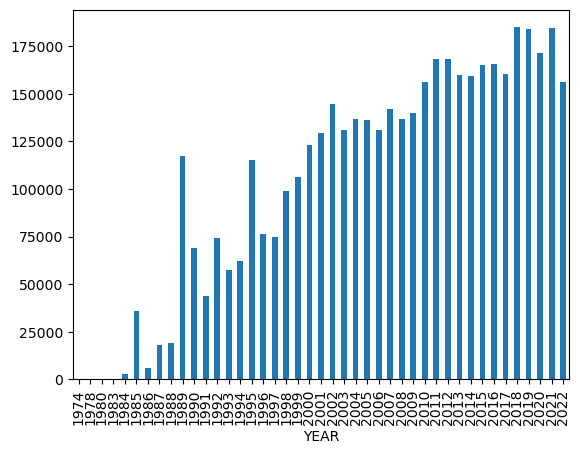

In [53]:
ddw.groupby('YEAR')['YEAR'].count().plot(kind='bar')

In [54]:
ddw = ddw[ddw.YEAR >= 2000]

In [55]:
ddw.shape

(3535844, 27)

<AxesSubplot: xlabel='YEAR'>

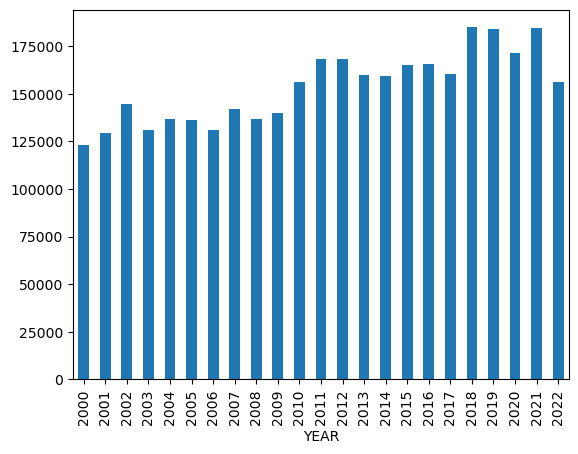

In [56]:
ddw.groupby('YEAR')['YEAR'].count().plot(kind='bar')

In [57]:
ddw.groupby('GM_WELL_ID')['GM_WELL_ID'].count()

GM_WELL_ID
CA1502595_001_001    424
CA1510701_010_010    727
CA1510701_011_011    738
CA1510701_016_016    569
CA1900003_001_001     31
                    ... 
CA3610047_005_005     28
CA3610047_006_006    711
CA3610047_008_008    663
CA3610120_013_013    844
CA3610120_016_016    684
Name: GM_WELL_ID, Length: 1608, dtype: int64

In [58]:
ddw[ddw['GM_RESULT'] != ddw['SRC_RESULT']][['SRC_RESULT','GM_RESULT','SRC_RESULT_UNITS','GM_RESULT_UNITS']].value_counts()

SRC_RESULT  GM_RESULT   SRC_RESULT_UNITS  GM_RESULT_UNITS
10.00       0.0100      UG/L              MG/L               6497
0.50        0.0005      UG/L              MG/L               5374
50.00       0.0500      UG/L              MG/L               3941
100.00      0.1000      UG/L              MG/L               2128
21.00       4.7000      MG/L              MG/L               1256
                                                             ... 
28.30       0.0283      UG/L              MG/L                  1
28.39       6.4130      MG/L              MG/L                  1
28.49       6.4360      MG/L              MG/L                  1
28.69       6.4810      MG/L              MG/L                  1
61600.00    13915.0000  MG/L              MG/L                  1
Length: 4943, dtype: int64

In [59]:
ddw[ddw['GM_RESULT'] == ddw['SRC_RESULT']][['SRC_RESULT','GM_RESULT','SRC_RESULT_UNITS','GM_RESULT_UNITS']].value_counts()

SRC_RESULT  GM_RESULT  SRC_RESULT_UNITS  GM_RESULT_UNITS
0.00        0.00       UG/L              UG/L               812209
0.50        0.50       UG/L              UG/L               230976
0.00        0.00       UG/L              MG/L                40463
1.00        1.00       UG/L              UG/L                34708
3.00        3.00       UG/L              UG/L                24298
                                                             ...  
52.42       52.42      UG/L              UG/L                    1
52.40       52.40      PCI/L             pCi/L                   1
52.36       52.36      UG/L              UG/L                    1
52.35       52.35      UG/L              UG/L                    1
206196.00   206196.00  MG/L              MG/L                    1
Length: 15974, dtype: int64

In [60]:
ddw[ddw['GM_RESULT_UNITS'] != ddw['SRC_RESULT_UNITS']][['SRC_RESULT_UNITS','GM_RESULT_UNITS']].value_counts()

SRC_RESULT_UNITS  GM_RESULT_UNITS
UG/L              MG/L               156187
PCI/L             pCi/L               34888
UMHO/CM           UMHOS/CM             6308
US                UMHOS/CM             6036
NG/L              UG/L                 1309
UG/L              pCi/L                 360
MG/L              UG/L                    9
dtype: int64

In [61]:
ddw.columns

Index(['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_SAMP_COLLECTION_DATE', 'GM_REPORTING_LIMIT', 'GM_LATITUDE',
       'GM_LONGITUDE', 'GM_TOP_DEPTH_OF_SCREEN_FT',
       'GM_BOTTOM_DEPTH_OF_SCREEN_FT', 'GM_ALTWELL_ID1', 'SRC_CHEMICAL',
       'SRC_RESULT_MODIFIER', 'SRC_RESULT', 'SRC_RESULT_UNITS',
       'SRC_SAMP_COLLECTION_DATE', 'SRC_SAMP_COLLECTION_TIME',
       'SRC_REPORTING_LIMIT', 'SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE',
       'SRC_LATITUDE', 'SRC_LONGITUDE', 'YEAR', 'MONTH', 'DAY'],
      dtype='object')

In [62]:
ddw = ddw[['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_REPORTING_LIMIT', 'GM_LATITUDE',
       'GM_LONGITUDE', 'GM_TOP_DEPTH_OF_SCREEN_FT',
       'GM_BOTTOM_DEPTH_OF_SCREEN_FT', 'GM_ALTWELL_ID1','SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE','YEAR', 'MONTH', 'DAY']]

In [63]:
geometry = [Point(xy) for xy in zip(ddw.GM_LONGITUDE,ddw.GM_LATITUDE)]

In [64]:
crs = {'init':'epsg:4326'}

In [65]:
geo_ddw = gpd.GeoDataFrame(ddw, crs = crs, geometry= geometry)

C:\Users\Radhai\anaconda3\envs\EDA\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [66]:
geo_ddw.head()

,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,GM_TOP_DEPTH_OF_SCREEN_FT,GM_BOTTOM_DEPTH_OF_SCREEN_FT,GM_ALTWELL_ID1,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,YEAR,MONTH,DAY,geometry
0,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,2.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,5,8,POINT (-118.69374 34.81415)
1,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,2.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,5,8,POINT (-118.69374 34.81415)
2,CA1502595_001_001,SC,Specific Conductivity,=,570.00,UMHOS/CM,0.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,9,8,POINT (-118.69374 34.81415)
3,CA1502595_001_001,PH,pH,=,7.72,PH UNITS,0.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,9,8,POINT (-118.69374 34.81415)
4,CA1502595_001_001,ALK,"Alkalinity, total",=,230.00,MG/L,0.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,9,8,POINT (-118.69374 34.81415)


In [67]:
geo_ddw_2012 = geo_ddw[geo_ddw['YEAR'] == 2012]

In [68]:
geo_ddw_2017 = geo_ddw[geo_ddw['YEAR'] == 2017]

In [69]:
geo_ddw_2022 = geo_ddw[geo_ddw['YEAR'] == 2022]

In [70]:
geo_ddw_2012.head()



,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,GM_TOP_DEPTH_OF_SCREEN_FT,GM_BOTTOM_DEPTH_OF_SCREEN_FT,GM_ALTWELL_ID1,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,YEAR,MONTH,DAY,geometry
3181259,CA1910156_013_013,CL,Chloride,=,86.8000,MG/L,NaN,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181260,CA1910156_013_013,FC12,Dichlorodifluoromethane,<,0.0005,MG/L,NaN,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181261,CA1910156_013_013,FC113,"1,1,2-Trichloro-1,2,2-Trifluoroethane (Freon 113)",<,0.0100,MG/L,0.01,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181262,CA1910156_013_013,TBME,Bromoform (THM),<,1.0000,UG/L,1.00,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181263,CA1910156_013_013,XYLENES,Xylenes (total),<,0.5000,UG/L,0.50,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)


In [71]:
geo_ddw_2012.columns

Index(['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_REPORTING_LIMIT', 'GM_LATITUDE', 'GM_LONGITUDE',
       'GM_TOP_DEPTH_OF_SCREEN_FT', 'GM_BOTTOM_DEPTH_OF_SCREEN_FT',
       'GM_ALTWELL_ID1', 'SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE', 'YEAR',
       'MONTH', 'DAY', 'geometry'],
      dtype='object')

In [72]:
geo_ddw_2012.shape

(168589, 18)

In [73]:
geo_ddw_2012.GM_CHEMICAL_NAME.value_counts()

Nitrate as N                      4752
Tetrachloroethene (PCE)           4128
Trichloroethene (TCE)             4071
1,1 Dichloroethylene (1,1 DCE)    3245
MTBE (Methyl-tert-butyl ether)    3136
                                  ... 
Bromoacetic Acid                     2
Dibromoacetic acid                   2
Chloroacetic Acid                    2
Dichloroacetic Acid                  2
Trichloroacetic Acid                 2
Name: GM_CHEMICAL_NAME, Length: 177, dtype: int64

In [74]:
geo_ddw_2012.GM_CHEMICAL_VVL.value_counts()

NO3N          4752
PCE           4128
TCE           4071
DCE11         3245
MTBE          3136
              ... 
BRACETICA        2
DBRACETICA       2
CAA              2
DCAA             2
TCAA             2
Name: GM_CHEMICAL_VVL, Length: 176, dtype: int64

In [75]:
geo_ddw_2012[geo_ddw_2012['GM_CHEMICAL_NAME'] == 'Atrazine']

,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,GM_TOP_DEPTH_OF_SCREEN_FT,GM_BOTTOM_DEPTH_OF_SCREEN_FT,GM_ALTWELL_ID1,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,YEAR,MONTH,DAY,geometry
3190252,CA1910124_045_045,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.153392,-118.087330,380.0,625.0,1910124-045,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.08733 34.15339)
3190492,CA1910124_005_005,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.149462,-118.079313,111.0,161.0,1910124-005,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.07931 34.14946)
3190515,CA1910124_021_021,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.196133,-118.167736,250.0,325.0,1910124-021,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.16774 34.19613)
3190678,CA1910124_001_001,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.200000,-118.166667,NaN,NaN,1910124-001,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.16667 34.20000)
3201045,CA1910242_008_008,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.674293,-118.439548,90.0,160.0,1910242-008,NaN,BSK ANALYTICAL LABORATORIES,2012,12,12,POINT (-118.43955 34.67429)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796659,CA1910036_003_003,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.020979,-118.162513,0.0,88.0,1910036-003,NaN,BSK ANALYTICAL LABORATORIES,2012,1,18,POINT (-118.16251 34.02098)
3798241,CA1910152_015_015,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,33.948646,-118.171867,0.0,240.0,1910152-015,NaN,EUROFINS CALSCIENCE IRVINE,2012,1,19,POINT (-118.17187 33.94865)
3825503,CA1910092_013_013,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.054542,-118.078033,201.0,401.0,1910092-013,NaN,CLINICAL LABORATORY OF SAN BERNARDINO,2012,1,11,POINT (-118.07803 34.05454)
3825953,CA1910092_038_038,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.056494,-118.072583,250.0,450.0,1910092-038,NaN,CLINICAL LABORATORY OF SAN BERNARDINO,2012,1,11,POINT (-118.07258 34.05649)


In [76]:
geo_ddw_2012_NO3N = geo_ddw_2012[geo_ddw_2012['GM_CHEMICAL_VVL'] == 'NO3N']

In [77]:
geo_ddw_2012_NO3N.explore(
     column="GM_RESULT_MODIFIER", # make choropleth based on "Neighborhood" column
     tooltip='GM_RESULT', # show the values of the columns in tooltip (on hover)
     legend= 'GM_RESULT_MODIFIER',
     popup=True, # show all values in popup (on click)
   
    )


In [78]:
print(max(geo_ddw_2012_NO3N.GM_LATITUDE), min(geo_ddw_2012_NO3N.GM_LATITUDE))
print(max(geo_ddw_2012_NO3N.GM_LONGITUDE), min(geo_ddw_2012_NO3N.GM_LONGITUDE))

34.817012 33.351227
-117.659908 -118.89808


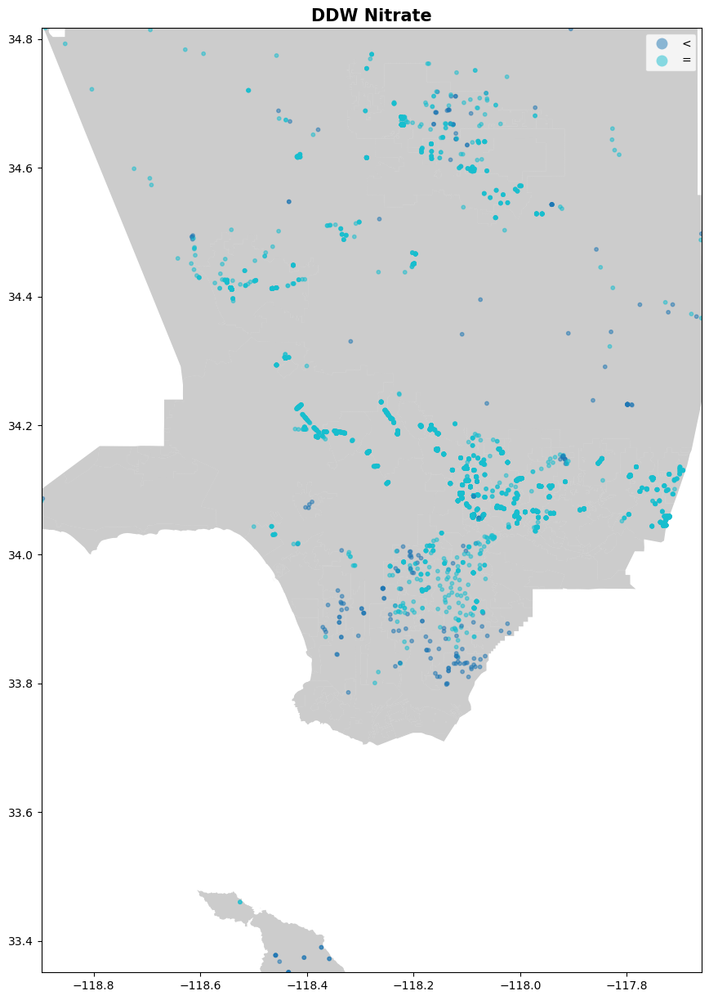

In [79]:
fig, ax = plt.subplots(figsize = (15,15))

map.plot(ax=ax, alpha = 0.4, color = 'grey')


geo_ddw_2012_NO3N.plot(column = 'GM_RESULT_MODIFIER', ax=ax, alpha = 0.5, legend= True, markersize = 10)

plt.title('DDW Nitrate', fontsize=15, fontweight = 'bold')

plt.xlim(min(geo_ddw_2012_NO3N.GM_LONGITUDE), max(geo_ddw_2012_NO3N.GM_LONGITUDE))
plt.ylim(min(geo_ddw_2012_NO3N.GM_LATITUDE), max(geo_ddw_2012_NO3N.GM_LATITUDE))

plt.show()

In [80]:
geo_ddw_2012_TCE = geo_ddw_2012[geo_ddw_2012['GM_CHEMICAL_VVL'] == 'TCE']

In [81]:
geo_ddw_2012_TCE.explore(
     column="GM_RESULT_MODIFIER", # make choropleth based on "Neighborhood" column
     tooltip='GM_RESULT', # show the values of the columns in tooltip (on hover)
     legend= 'GM_RESULT_MODIFIER',
     popup=True, # show all values in popup (on click)
   
    )

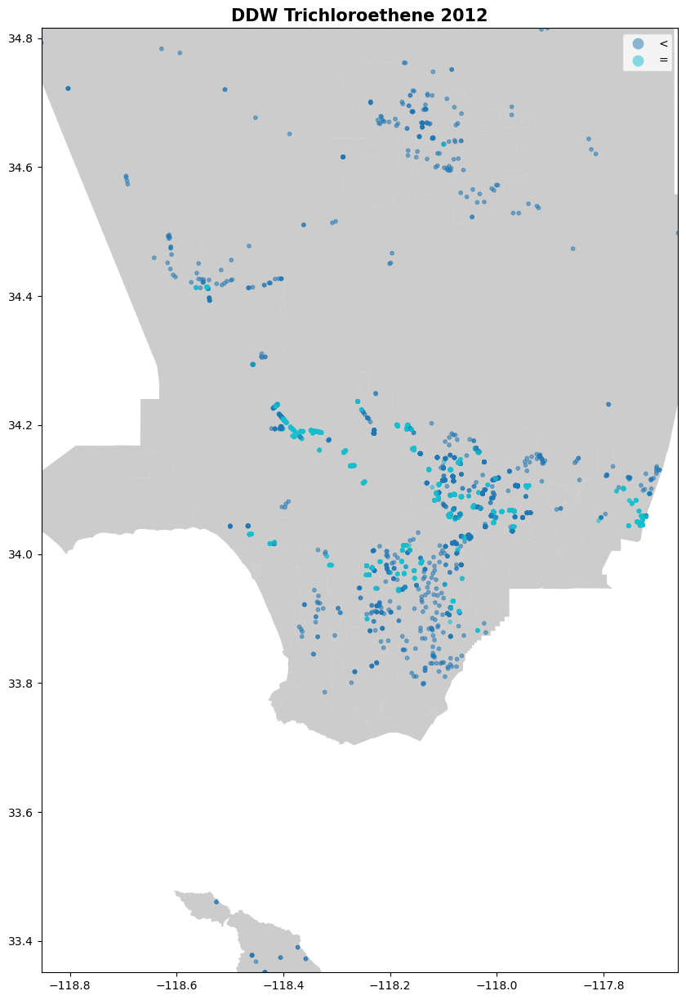

In [82]:
fig, ax = plt.subplots(figsize = (15,15))

map.plot(ax=ax, alpha = 0.4, color = 'grey')


geo_ddw_2012_TCE.plot(column = 'GM_RESULT_MODIFIER', ax=ax, alpha = 0.5, legend= True, markersize = 10)

plt.title('DDW Trichloroethene 2012', fontsize=15, fontweight = 'bold')

plt.xlim(min(geo_ddw_2012_TCE.GM_LONGITUDE), max(geo_ddw_2012_TCE.GM_LONGITUDE))
plt.ylim(min(geo_ddw_2012_TCE.GM_LATITUDE), max(geo_ddw_2012_TCE.GM_LATITUDE))

plt.show()

In [83]:
geo_ddw_2022_TCE = geo_ddw[(geo_ddw['GM_CHEMICAL_VVL'] == 'TCE') & (geo_ddw['YEAR'] == 2022)]


In [84]:
def geoplot(df, map, title):
    fig, ax = plt.subplots(figsize = (15,15))
    map=map
    map.plot(ax=ax, alpha = 0.4, color = 'grey')


    df.plot(column = 'GM_RESULT_MODIFIER', ax=ax, alpha = 0.5, legend= True, markersize = 10)

    plt.title(col_name, fontsize=15, fontweight = 'bold')

    plt.xlim(min(df.GM_LONGITUDE), max(df.GM_LONGITUDE))
    plt.ylim(min(df.GM_LATITUDE), max(df.GM_LATITUDE))

    plt.show()

NameError: name 'col_name' is not defined

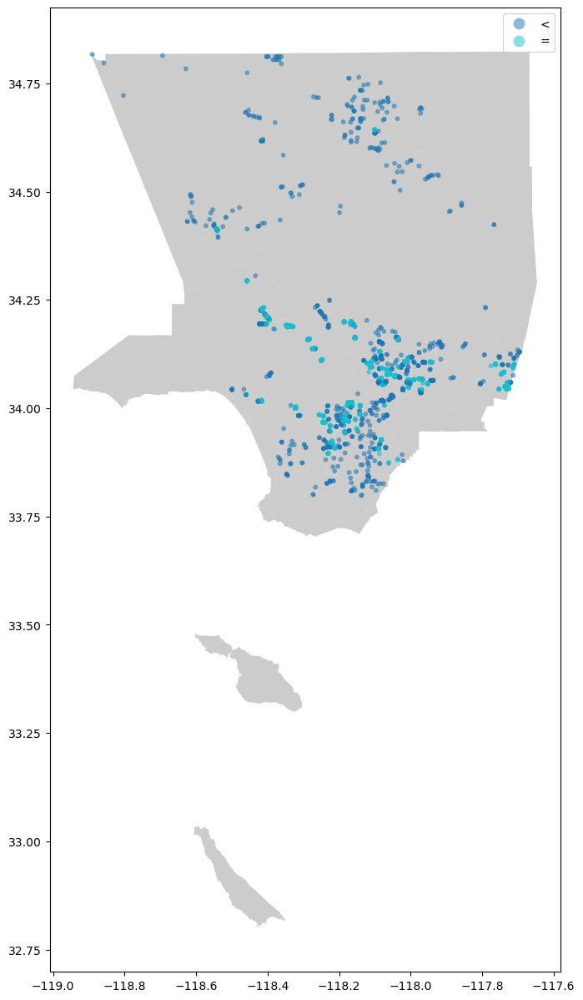

In [85]:
geoplot(geo_ddw_2022_TCE, map, 'DDW Trichloroethylene 2022')

In [ ]:
geo_ddw_2022_TCE.explore(
     column="GM_RESULT_MODIFIER", # make choropleth based on "Neighborhood" column
     tooltip='GM_RESULT', # show the values of the columns in tooltip (on hover)
     legend= 'GM_RESULT_MODIFIER',
     popup=True, # show all values in popup (on click)
   
    )